### Correlation between principal coordinate analysis on microbiome data and environmental factors 

In [1]:

#setworking directory to AbioticAraMicrobe/
setwd('../')

In [2]:
#load packages
library(reshape2)
library(vegan)
library(dplyr)
library(ggplot2)
library(ggpubr)
library(leaps)


Loading required package: permute

Loading required package: lattice

This is vegan 2.6-2


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [28]:
#preapare environmental factor as a raw data and normalize one. both in spread form which environmental factors are in different columns and the valus are identical based on different "site_season_year"
library(tidyr)
env_data <- read.table("data/environmental_data.txt" , header = TRUE)
env_data <- separate(data = env_data , col = variable , into = c("Month1" , "Season") , sep = "_" , remove = FALSE)
d1 <- data.frame("envdata"=unique(env_data$env_factor))
#add full names of env factors
d1$environmentalfactor <- c("Precipitation" , "Vapor_Pressure_Deficit" , "Palmer_Drought_Severity_Index" , "Soil_Moisture" , "Runoff" , "Downward_Surface_Shortwave_Radiation" , "Climate_Water_Deficit" , "Actual_Evapotranspiration" , "Vapor_Pressure" , 
                            "Min_Temperature" , "Snow_Water_Equivalent" , "Potential_Evapotranspiration" , "Max_Temperature" , "Wind_Speed")
d1$environmentalfactor = gsub("Downward_Surface_Shortwave_Radiation" ,"Radiation" , d1$environmentalfactor)
d1$environmentalfactor = gsub("Palmer_Drought_Severity_Index" ,"Drought" , d1$environmentalfactor)
head(d1)

env_data <- merge(env_data , d1 , by.x = "env_factor" , by.y = "envdata")
env_data$env_value = env_data$value
env_data$season_site <- paste(env_data$Season,env_data$Site)
env_data$site_season_year = paste(env_data$Site , env_data$Season , env_data$Year , sep = "_" )###########################################data1
env_data$site_season_year_env = paste(env_data$Site , env_data$Season , env_data$Year,env_data$environmentalfactor , sep = "_" )
#head(env_data)

#spread env data in different columns
env_data_count <- env_data[c("site_season_year" , "environmentalfactor" , "env_value")] %>% spread(environmentalfactor,env_value) ########################data2
#head(env_data_count)

#normalized env data 
#normalize the environmental data , first group them then do normalization this is z transformation 
stdize=function(x) {(x - mean(x))/sd(x)}
#stdize=function(x) {log10((x/sum(x))+1)}
env_data_norm <- data.frame(env_data_count[1] , apply(env_data_count[2:ncol(env_data_count)] ,2, stdize)) #2 is the margin , apply on the columns ########################data3
#env_data_norm = env_data_count
#head(env_data_norm)
env_data_melt <- melt(env_data_norm ,id ="site_season_year" ,   variable.name = "env_factor" , value.name = "env_value_norm")
env_data_melt$site_season_year_env = paste(env_data_melt$site_season_year,env_data_melt$env_factor , sep = "_" )
env_data_melt <- merge(y =env_data[c("Site" , "Season" , "Year" , "env_value"  , "season_site" ,"site_season_year_env")],x=env_data_melt , by = "site_season_year_env") #########################data4
#head(env_data_melt)
#load microbiome data



,envdata,environmentalfactor
,<chr>,<chr>
1,ppt,Precipitation
2,vpd,Vapor_Pressure_Deficit
3,PDSI,Drought
4,soil,Soil_Moisture
5,q,Runoff
6,srad,Radiation


In [30]:
head(env_data_melt)

,site_season_year_env,site_season_year,env_factor,env_value_norm,Site,Season,Year,env_value,season_site
,<chr>,<chr>,<fct>,<dbl>,<chr>,<chr>,<int>,<dbl>,<chr>
1,ERG_Fall_2014_Actual_Evapotranspiration,ERG_Fall_2014,Actual_Evapotranspiration,-0.79264527,ERG,Fall,2014,16.90,Fall ERG
2,ERG_Fall_2014_Climate_Water_Deficit,ERG_Fall_2014,Climate_Water_Deficit,-0.44148181,ERG,Fall,2014,0.00,Fall ERG
3,ERG_Fall_2014_Drought,ERG_Fall_2014,Drought,1.75890428,ERG,Fall,2014,2.48,Fall ERG
4,ERG_Fall_2014_Max_Temperature,ERG_Fall_2014,Max_Temperature,0.05012492,ERG,Fall,2014,9.83,Fall ERG
5,ERG_Fall_2014_Min_Temperature,ERG_Fall_2014,Min_Temperature,0.99069671,ERG,Fall,2014,3.45,Fall ERG
6,ERG_Fall_2014_Potential_Evapotranspiration,ERG_Fall_2014,Potential_Evapotranspiration,-0.83417305,ERG,Fall,2014,16.90,Fall ERG


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


[1] "x" "y"

Warning message:
“The dot-dot notation (`..r.label..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(r.label)` instead.”


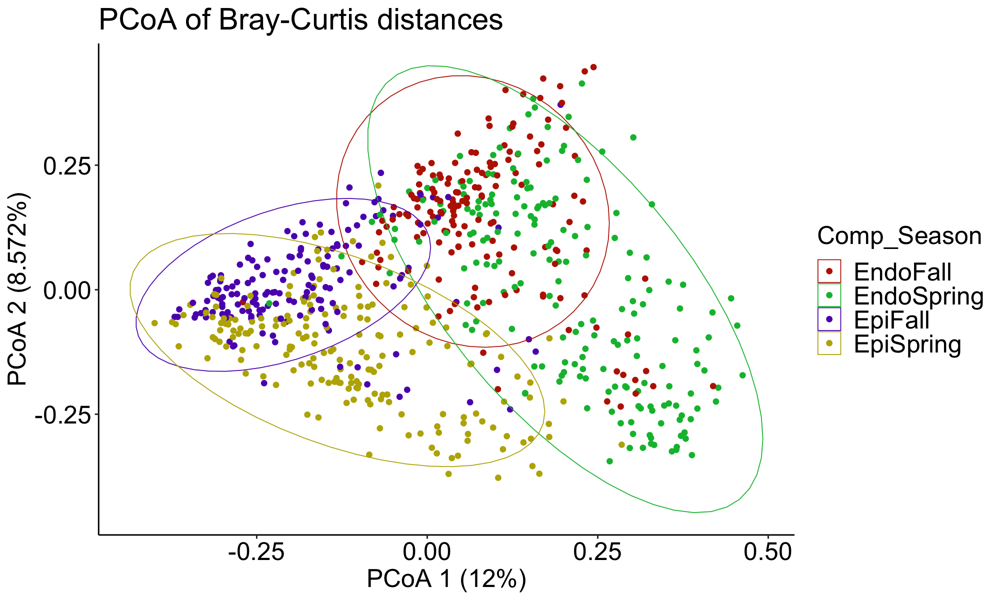

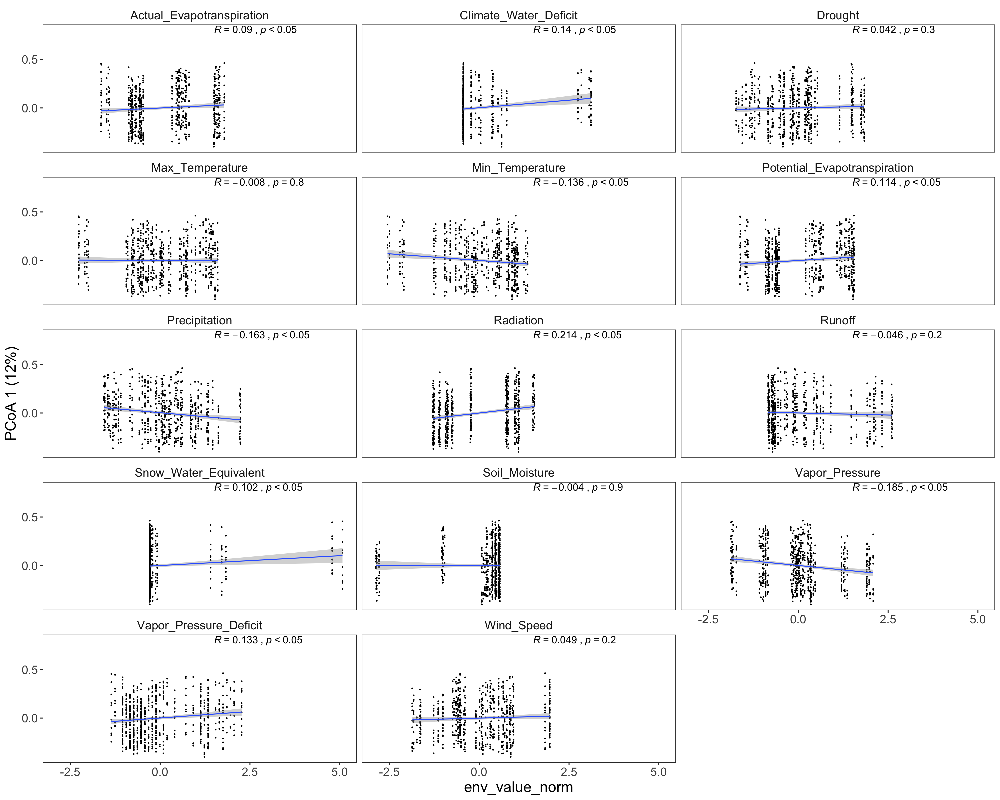

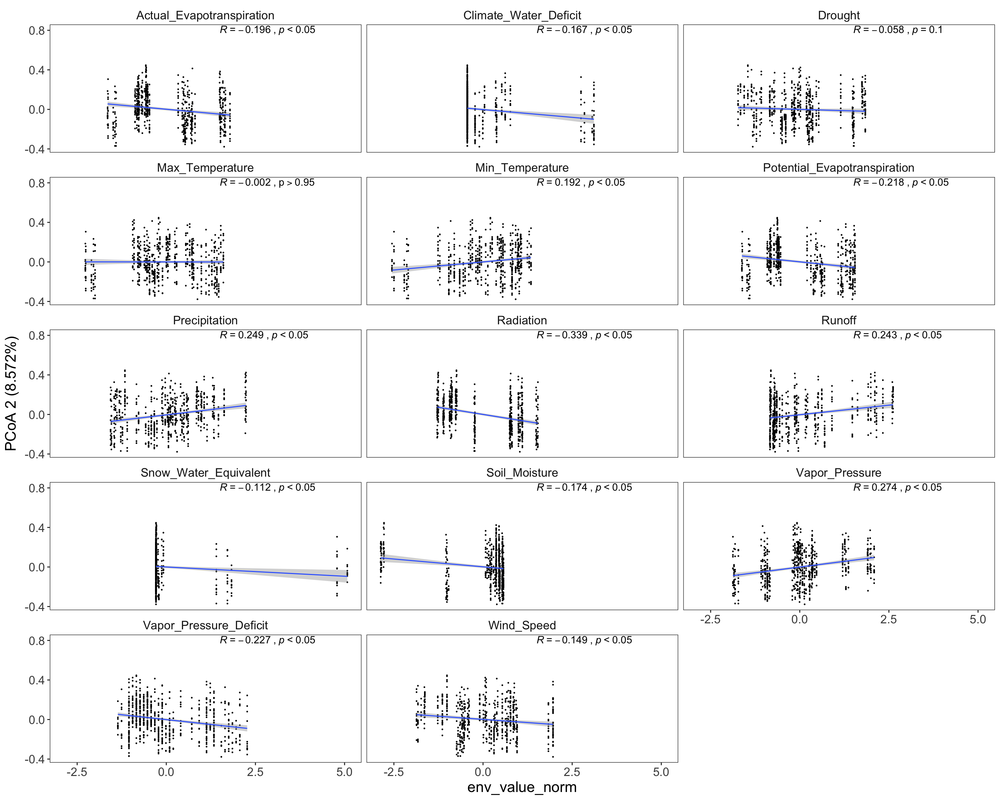

In [31]:

#Pcoa on Bacteria data, and plot pcoa1 vs. environmental factors
data <- read.table("data/DataClean/BV5Otu.txt" , header = T)
firstotuname = "Otu000002"
#head(data)
rownames(data) <- data$Samplenumber
n <- which(colnames(data)==firstotuname)
data1 <- data[-c(1:n-1)]
metadata = data[c(1:n-1)]
metadata$site_season_year <- paste(metadata$Site , metadata$Season , metadata$Year , sep = "_")
metadata$Comp_Season <- paste(metadata$Compartment , metadata$Season, sep = "")
d1 <- metadata
metada_env_data_norm <- merge(d1,env_data_norm , by = "site_season_year" )
rownames(metada_env_data_norm) = metada_env_data_norm$Samplenumber
metadata <- metadata[c("Samplenumber" , "site_season_year" , "Lib" , "Run" , "Infection" , "Compartment")]

metadata <- merge(metadata , env_data_melt , by = "site_season_year")
log_transform=function(x) {log10((x/rowSums(x))+1)}
#log_transform=function(x) {(x/rowSums(x))}
log_data <- log_transform(data1)
dis  <- vegdist(log_data, "bray")
k <- 2
pcoa <- cmdscale(dis, k=k, eig=T)
points <- pcoa$points
eig <- pcoa$eig
points <- as.data.frame(points)
colnames(points) <- c("x", "y")
#rownames(points)
points1 <- cbind(points, d1[match(rownames(points), rownames(d1)), ])
points1 <- data.frame(cbind(points1, metadata[match(rownames(points1), rownames(metadata)), ]))
#points1

# calculate centroids per condition and joining segments

centroids <- aggregate(cbind(points1$x, points1$y) ~ Comp_Season, data=points1, FUN=mean)
segments <- merge(points1[c("Comp_Season" ,"Samplenumber")], setNames(centroids, c('Comp_Season','seg_x','seg_y')), by='Comp_Season', sort=FALSE)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
PC1percentageB = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")
PC2percentageB = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

color = c("#bb2200","#00bb3b"  , "#5e00bb" , "#bbaf00" , "#0072B2", "#D55E00", "#CC79A7")
p <- ggplot(points1, aes(x=x, y=y, color=Comp_Season)) +
     geom_point() +
     labs(x=paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep=""),
     y=paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")) +
     ggtitle("PCoA of Bray-Curtis distances") + stat_ellipse(aes(fill= Comp_Season, size = 3),geom = "polygon", type="t", alpha=0 , size = 0.3) + theme_classic() + theme(legend.text = element_text(colour="black", size = 18),
            legend.title = element_text(face = NULL),

            text = element_text(size = 18) ,
            axis.title.x = element_text(colour = "black" , size = 18) , 
            axis.text.x = element_text(colour = "black" , size = 18) , 
            axis.text.y = element_text(colour = "black" , size = 18) , 
            axis.title.y = element_text(colour = "black" ,size = 18),
            strip.text = element_text(colour = "black" ,size = 18)) + scale_color_manual(values = color) 



options(repr.plot.width = 10, repr.plot.height =6, repr.plot.res = 200)
p
colnames(points)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, x )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200) 
p




ylab = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, y )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200)
p

Bdata = points2
Bdata$taxa = "Bacteria"

[1] "x" "y"

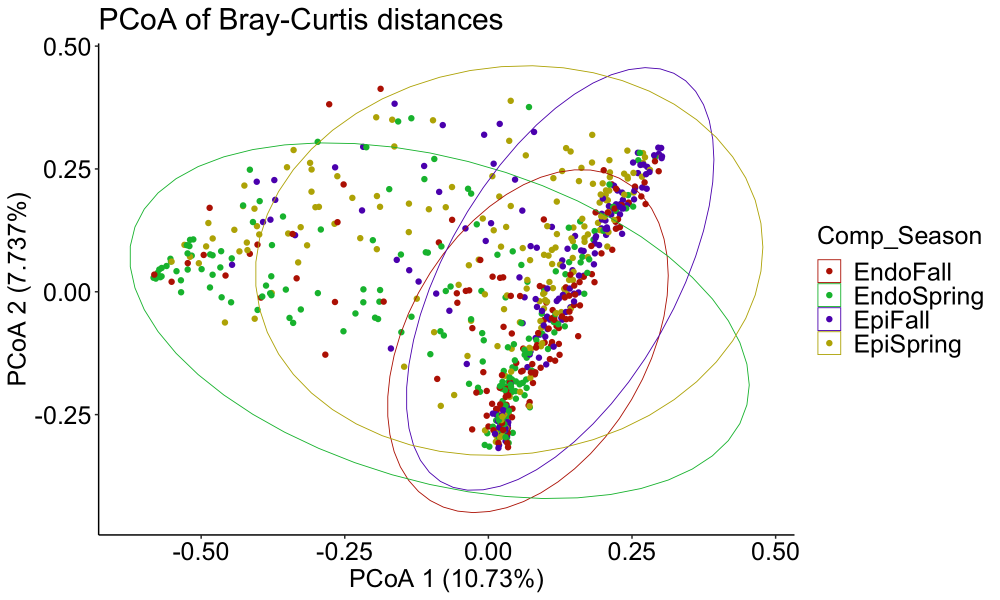

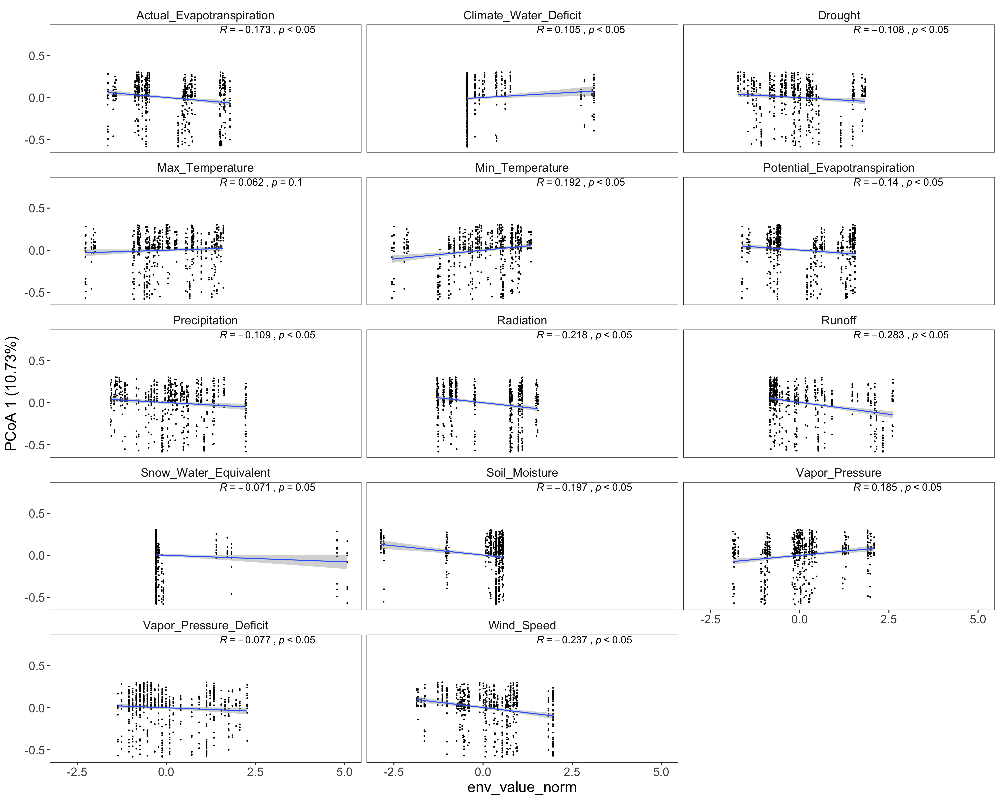

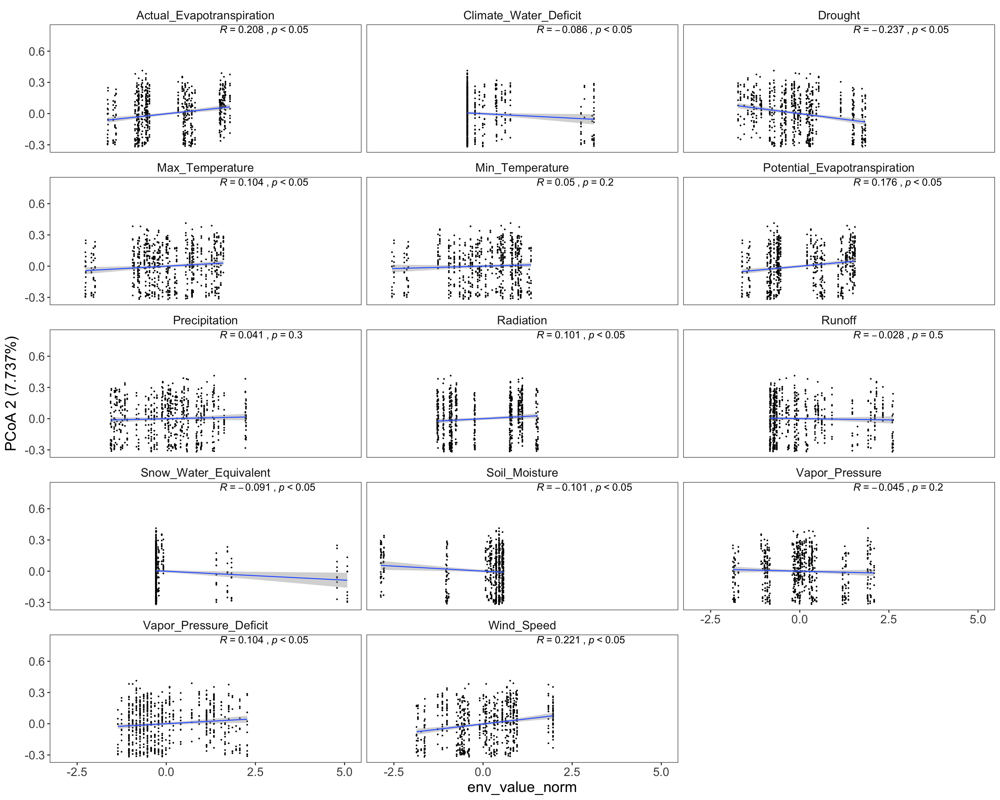

In [32]:
##Pcoa on Fungi data, and plot pcoa1 vs. environmental factors
data <- read.table("data/DataClean/FITS2Otu.txt" , header = T)
firstotuname = "Otu00002"
#head(data)
rownames(data) <- data$Samplenumber
n <- which(colnames(data)==firstotuname)
data1 <- data[-c(1:n-1)]
metadata = data[c(1:n-1)]
metadata$site_season_year <- paste(metadata$Site , metadata$Season , metadata$Year , sep = "_")
metadata$Comp_Season <- paste(metadata$Compartment , metadata$Season, sep = "")
d1 <- metadata
metada_env_data_norm <- merge(d1,env_data_norm , by = "site_season_year" )
rownames(metada_env_data_norm) = metada_env_data_norm$Samplenumber
metadata <- metadata[c("Samplenumber" , "site_season_year" , "Lib" , "Run" , "Infection" , "Compartment")]

metadata <- merge(metadata , env_data_melt , by = "site_season_year")
log_transform=function(x) {log10((x/rowSums(x))+1)}
#log_transform=function(x) {(x/rowSums(x))}
log_data <- log_transform(data1)
dis  <- vegdist(log_data, "bray")
k <- 2
pcoa <- cmdscale(dis, k=k, eig=T)
points <- pcoa$points
eig <- pcoa$eig
points <- as.data.frame(points)
colnames(points) <- c("x", "y")
#rownames(points)
points1 <- cbind(points, d1[match(rownames(points), rownames(d1)), ])
points1 <- data.frame(cbind(points1, metadata[match(rownames(points1), rownames(metadata)), ]))
#points1

# calculate centroids per condition and joining segments

centroids <- aggregate(cbind(points1$x, points1$y) ~ Comp_Season, data=points1, FUN=mean)
segments <- merge(points1[c("Comp_Season" ,"Samplenumber")], setNames(centroids, c('Comp_Season','seg_x','seg_y')), by='Comp_Season', sort=FALSE)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
PC1percentageF = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")
PC2percentageF = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

color = c("#bb2200","#00bb3b"  , "#5e00bb" , "#bbaf00" , "#0072B2", "#D55E00", "#CC79A7")
p <- ggplot(points1, aes(x=x, y=y, color=Comp_Season)) +
     geom_point() +
     labs(x=paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep=""),
     y=paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")) +
     ggtitle("PCoA of Bray-Curtis distances") + stat_ellipse(aes(fill= Comp_Season, size = 3),geom = "polygon", type="t", alpha=0 , size = 0.3) + theme_classic() + theme(legend.text = element_text(colour="black", size = 18),
            legend.title = element_text(face = NULL),

            text = element_text(size = 18) ,
            axis.title.x = element_text(colour = "black" , size = 18) , 
            axis.text.x = element_text(colour = "black" , size = 18) , 
            axis.text.y = element_text(colour = "black" , size = 18) , 
            axis.title.y = element_text(colour = "black" ,size = 18),
            strip.text = element_text(colour = "black" ,size = 18)) + scale_color_manual(values = color) 



options(repr.plot.width = 10, repr.plot.height =6, repr.plot.res = 200)
p
colnames(points)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, x )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200) 
p




ylab = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, y )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200)
p

Fdata = points2
Fdata$taxa = "Fungi"

[1] "x" "y"

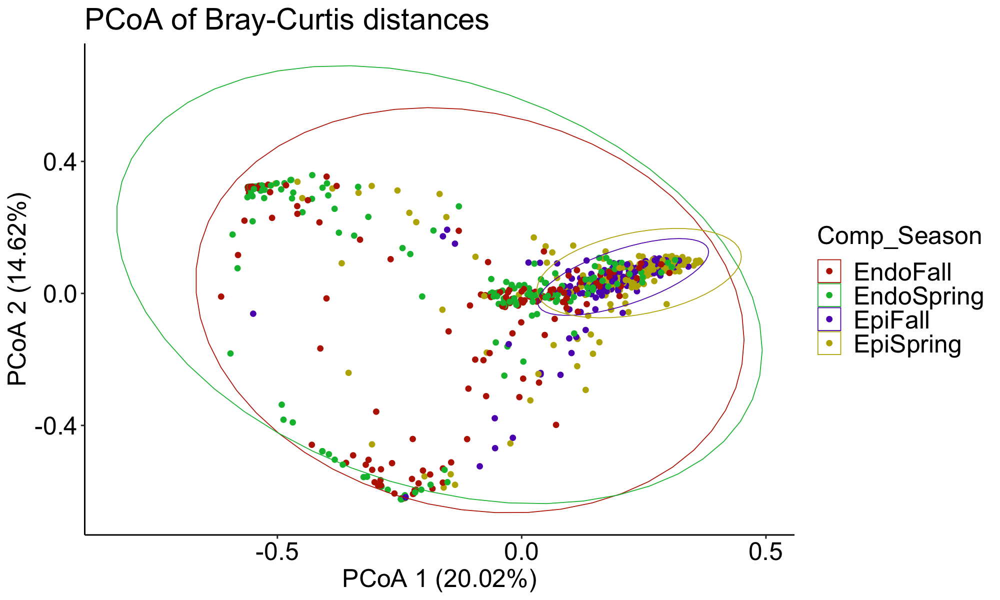

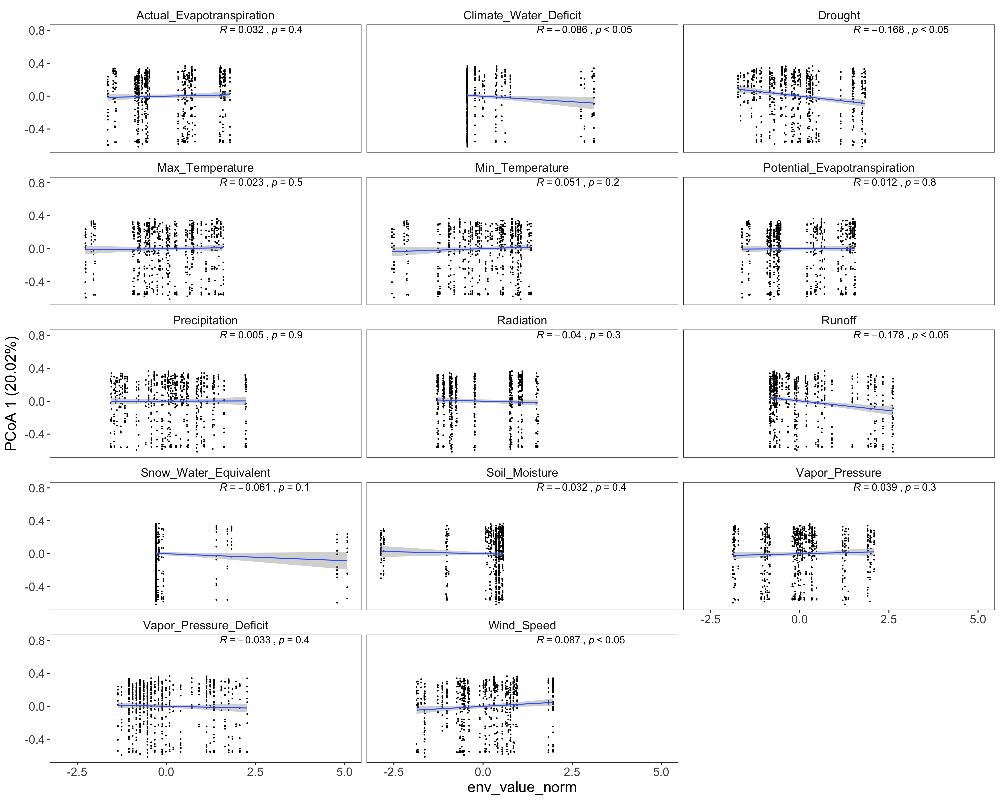

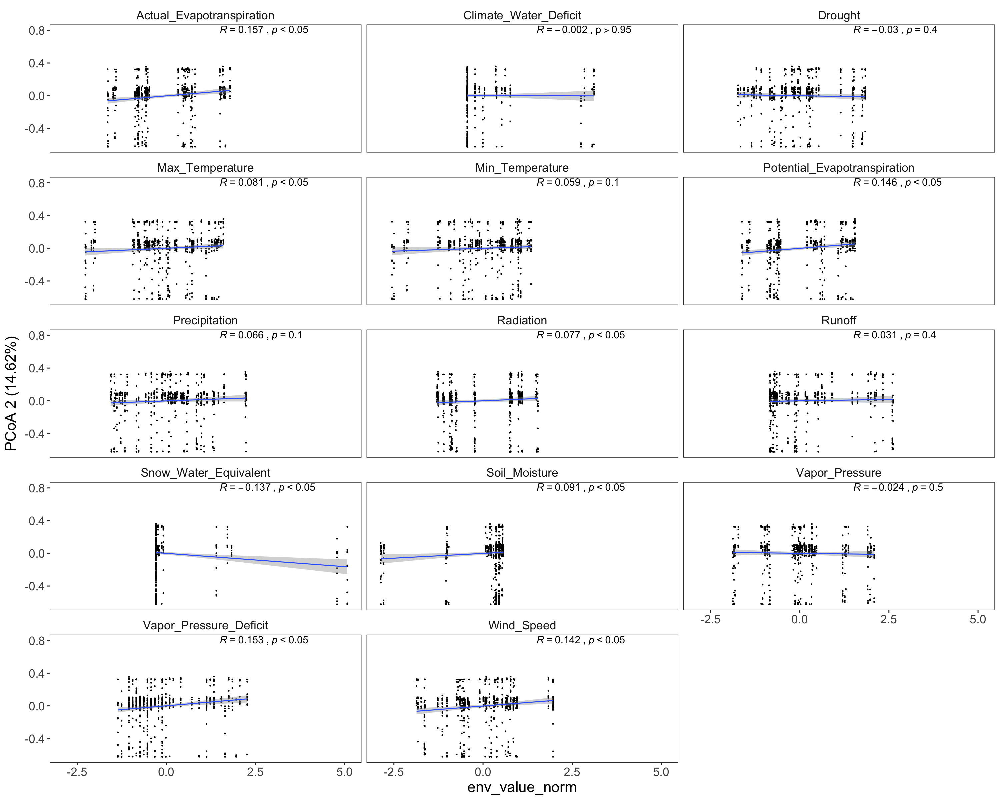

In [33]:
#Pcoa on Eukaryotes data, and plot pcoa1 vs. environmental factors
data <- read.table("data/DataClean/PV9Otu.txt" , header = T)
firstotuname = "Otu00002"
#head(data)
rownames(data) <- data$Samplenumber
n <- which(colnames(data)==firstotuname)
data1 <- data[-c(1:n-1)]
metadata = data[c(1:n-1)]
metadata$site_season_year <- paste(metadata$Site , metadata$Season , metadata$Year , sep = "_")
metadata$Comp_Season <- paste(metadata$Compartment , metadata$Season, sep = "")
d1 <- metadata
metada_env_data_norm <- merge(d1,env_data_norm , by = "site_season_year" )
rownames(metada_env_data_norm) = metada_env_data_norm$Samplenumber
metadata <- metadata[c("Samplenumber" , "site_season_year" , "Lib" , "Run" , "Infection" , "Compartment")]

metadata <- merge(metadata , env_data_melt , by = "site_season_year")
#log_transform=function(x) {log10((x/rowSums(x))+1)}
log_transform=function(x) {(x/rowSums(x))}
log_data <- log_transform(data1)
dis  <- vegdist(log_data, "bray")
k <- 2
pcoa <- cmdscale(dis, k=k, eig=T)
points <- pcoa$points
eig <- pcoa$eig
points <- as.data.frame(points)
colnames(points) <- c("x", "y")
#rownames(points)
points1 <- cbind(points, d1[match(rownames(points), rownames(d1)), ])
points1 <- data.frame(cbind(points1, metadata[match(rownames(points1), rownames(metadata)), ]))
#points1

# calculate centroids per condition and joining segments

centroids <- aggregate(cbind(points1$x, points1$y) ~ Comp_Season, data=points1, FUN=mean)
segments <- merge(points1[c("Comp_Season" ,"Samplenumber")], setNames(centroids, c('Comp_Season','seg_x','seg_y')), by='Comp_Season', sort=FALSE)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
PC1percentageO = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")
PC2percentageO = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

color = c("#bb2200","#00bb3b"  , "#5e00bb" , "#bbaf00" , "#0072B2", "#D55E00", "#CC79A7")
p <- ggplot(points1, aes(x=x, y=y, color=Comp_Season)) +
     geom_point() +
     labs(x=paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep=""),
     y=paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")) +
     ggtitle("PCoA of Bray-Curtis distances") + stat_ellipse(aes(fill= Comp_Season, size = 3),geom = "polygon", type="t", alpha=0 , size = 0.3) + theme_classic() + theme(legend.text = element_text(colour="black", size = 18),
            legend.title = element_text(face = NULL),

            text = element_text(size = 18) ,
            axis.title.x = element_text(colour = "black" , size = 18) , 
            axis.text.x = element_text(colour = "black" , size = 18) , 
            axis.text.y = element_text(colour = "black" , size = 18) , 
            axis.title.y = element_text(colour = "black" ,size = 18),
            strip.text = element_text(colour = "black" ,size = 18)) + scale_color_manual(values = color) 



options(repr.plot.width = 10, repr.plot.height =6, repr.plot.res = 200)
p
colnames(points)

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

points2 <- merge(points, metadata , by.x = "row.names" , by.y = "Samplenumber")
df1 = points2
ylab = paste("PCoA 1 (", format(100 * eig[1] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, x )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200) 
p




ylab = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

p = ggplot(points2, aes(env_value_norm, y )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.8), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y=ylab)
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200)
p

Odata = points2
Odata$taxa = "Eukaryotes"

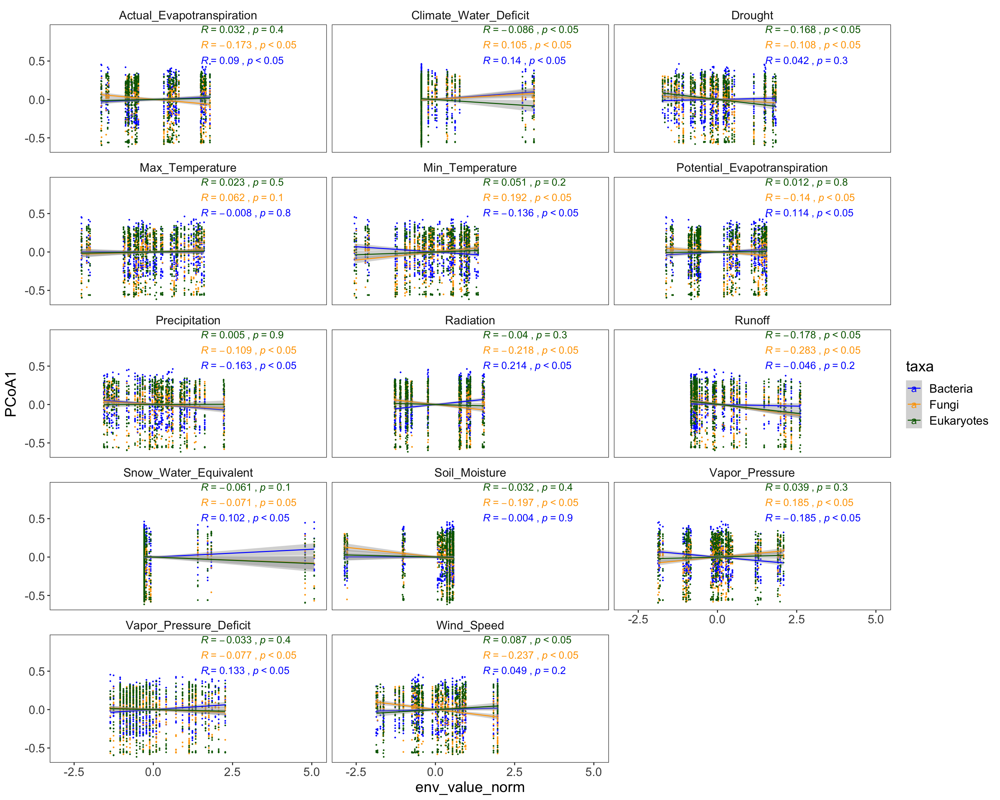

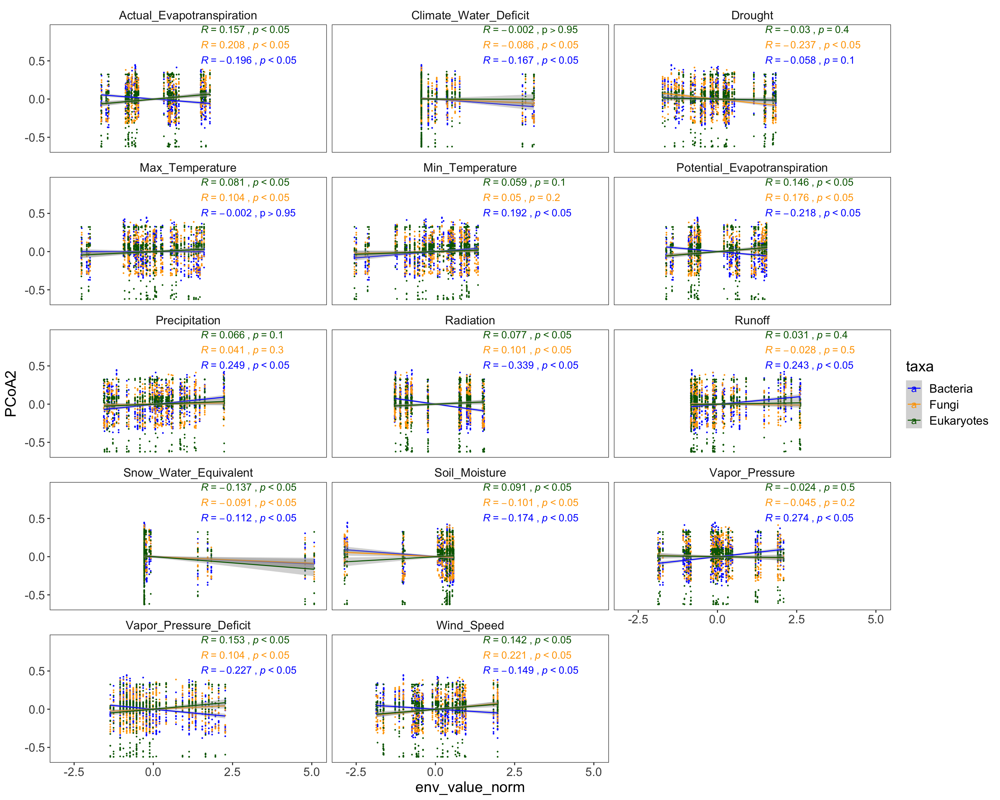

In [34]:
#merge pcoa data of all the microbial groups and plot together

alldata <- rbind(Bdata,Fdata ,Odata)
alldata$taxa = factor(alldata$taxa , levels = c('Bacteria','Fungi' , 'Eukaryotes'))
write.table(alldata , "plots/Pcoa_environmentalFactors_Data.csv" , row.names=FALSE , sep = ',' , quote = FALSE)

p = ggplot(alldata, aes(env_value_norm, x  , colour = taxa)) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.5,0.7,0.9), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) + labs(y="PCoA1")
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200) 
p

ggsave("plots/pcoa1_environmental_factor.pdf",p , width = 12 , height = 12)


ylab = paste("PCoA 2 (", format(100 * eig[2] / sum(eig), digits=4), "%)", sep="")

p = ggplot(alldata, aes(env_value_norm, y , colour = taxa )) +           
  geom_point(size = 0.2) +                                  
  stat_smooth(method = "lm",
              formula = y ~ x,
              geom = "smooth" ,size = 0.5) + facet_wrap(.~env_factor , nrow =5)  + scale_colour_manual(values = c("blue", "orange" , "darkgreen")) + theme_bw() + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank() , strip.background = element_blank() , text = element_text(size = 16)) + 
stat_cor(method = "pearson", label.x = 1.5, label.y = c(0.5,0.7,0.9), p.accuracy = 0.05, r.accuracy = 0.001 ,  aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~"))) +labs(y="PCoA2")
options(repr.plot.width = 15, repr.plot.height =12, repr.plot.res = 200)
p
ggsave("plots/pcoa2_environmental_factor.pdf",p , width = 12 , height = 12 , dpi = 150 , units = "in")